## Comparison of Fasttext Models without Using Stopwords and Using Stopwords

In [ ]:
# mount your drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!gdown https://drive.google.com/uc?id=1BpTkrFqGH4BoDBTcR3tmm9ZZuj6FjlLB
!gdown https://drive.google.com/uc?id=1puCMovgqC32m9AAshbASzGHDEgKvWEvM
!gdown https://drive.google.com/uc?id=1NtebE9VUzA4MvA56EuBSN-OVl7CODHo1

Downloading...
From: https://drive.google.com/uc?id=1BpTkrFqGH4BoDBTcR3tmm9ZZuj6FjlLB
To: /content/requirements.txt
100% 273/273 [00:00<00:00, 299kB/s]
Downloading...
From: https://drive.google.com/uc?id=1puCMovgqC32m9AAshbASzGHDEgKvWEvM
To: /content/src.zip
100% 18.1k/18.1k [00:00<00:00, 27.7MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1NtebE9VUzA4MvA56EuBSN-OVl7CODHo1
From (redirected): https://drive.google.com/uc?id=1NtebE9VUzA4MvA56EuBSN-OVl7CODHo1&confirm=t&uuid=f0e8f2e7-0e2d-465f-8e42-93e4059a2ae7
To: /content/data.zip
100% 76.5M/76.5M [00:01<00:00, 54.6MB/s]


In [ ]:
# extract data and source code (src)
!unzip /content/src.zip -d /content/
!unzip /content/data.zip -d /content/

Archive:  /content/src.zip
 extracting: /content/src/__init__.py  
   creating: /content/src/__pycache__/
  inflating: /content/src/__pycache__/__init__.cpython-37.pyc  
  inflating: /content/src/__pycache__/static_method.cpython-37.pyc  
  inflating: /content/src/__pycache__/topic_detection.cpython-37.pyc  
  inflating: /content/src/__pycache__/topic_semantic.cpython-37.pyc  
  inflating: /content/src/static_method.py  
  inflating: /content/src/topic_detection.py  
  inflating: /content/src/topic_semantic.py  
Archive:  /content/data.zip
  inflating: /content/data/centroid_fasttext_menggunakan_stopwords.csv  
  inflating: /content/data/centroid_fasttext_w2v_menggunakan_stopwords.csv  
  inflating: /content/data/centroid_w2v_menggunakan_stopwords.csv  
  inflating: /content/data/data_jurnal_clean.csv  
  inflating: /content/data/data_jurnal_fix.csv  
  inflating: /content/data/hasil_cluster_fasttext_menggunakan_stopwords.csv  
  inflating: /content/data/hasil_cluster_w2v_menggunakan_s

In [ ]:
# create env and install package
!pip3 install virtualenv
!virtualenv /content/disertasi
!source /content/disertasi; pip install --upgrade pip
!source /content/disertasi; pip install ipykernel
!source /content/disertasi; pip install -r /content/requirements.txt

%cd /content/
%ls

# !pip install networkx
!pip install numpy==1.25.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 47.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.9/468.9 kB 21.6 MB/s eta 0:00:00
created virtual environment CPython3.10.12.final.0-64 in 1177ms
  creator CPython3Posix(dest=/content/disertasi, clear=False, no_vcs_ignore=False, global=False)
  seeder FromAppData(download=False, pip=bundle, setuptools=bundle, wheel=bundle, via=copy, app_data_dir=/root/.local/share/virtualenv)
    added seed packages: pip==24.2, setuptools==75.1.0, wheel==0.44.0
  activators BashActivator,CShellActivator,FishActivator,NushellActivator,PowerShellActivator,PythonActivator
/bin/bash: line 1: source: /content/disertasi: is a directory
  Using cached pip-24.2-py3-none-any.whl.metadata (3.6 kB)
Using cached pip-24.2-py3-none-any.whl (1.8 MB)
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
/bin/bash: line 1: source: /content/disertasi: is a d

## Stop here and restart your session

In [ ]:
import os
import pandas as pd
import numpy as np

from nltk.tokenize import word_tokenize
from gensim.models import Word2Vec, FastText
import gensim
from string import punctuation
import time

In [ ]:
import nltk
nltk.download('wordnet')
nltk.download('punkt')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

# Prepare Corpus

In [ ]:
df = pd.read_csv("/content/data/data_jurnal_clean.csv")
df.head()

,year,title,authors,abstract,abstract_clean
0,2023.0,PENERAPAN PROFILE MATCHING PADA SISTEM PENUNJA...,"Azrul Akbar, dan Safitri Juanita, Program Stud...",An essential resource in the company in achiev...,essential resource the company achieving goal ...
1,2023.0,Resource allocation optimization for mitigatin...,"Sheetal Bagali, Ramakrishnan Sundaraguru, Corr...",Wireless underwater sensor networks (UWSNs) ar...,wireless underwater sensor network uwsns are u...
2,2023.0,Virtual reality eye exercises application base...,"Komang Candra Brata, Hanifah Muslimah Az-Zahra...","In many situations, ophthalmologists prescribe...",many situation ophthalmologist prescribe glass...
3,2023.0,Transformation to a smart factory using NodeMC...,"Maryam Abdulhakeem Hailan, Baraa Munqith Albak...",Incorporating internet of things (IoT) in indu...,incorporating internet thing iot industrial sy...
4,2023.0,Two-level frame aggregation with enhanced A-MP...,"Fatoumata Sorra, Mohamed Othman, Umar Ali Buka...",One of the most important frame aggregation fe...,one the most important frame aggregation featu...


In [ ]:
df.shape

(54689, 5)

In [ ]:
stopwords = []
f = open('/content/data/stopwords.txt', 'r')
for i in f.readlines():
    stopwords.append(i.replace('\n', ''))
sw_eng = stopwords + list(punctuation)

In [ ]:
def extract_words(df, columns, stopwords=None):
    data = df.copy()
    if stopwords is not None:
        return [[word for word in word_tokenize(review.lower().strip()) if word not in stopwords] for review in data[columns]]
    return [word_tokenize(review.lower().strip()) for review in data[columns]]

In [ ]:
# list word with stopwords
words_with_sw = extract_words(df, 'abstract_clean', stopwords=sw_eng)

# list word without stopwords
words_without_sw = extract_words(df, 'abstract_clean', stopwords=None)

# Train Fasttext Model

In [ ]:
# start = time.time()
# # model fasttext with stopwords
# model_with_sw1 = FastText(sentences=words_with_sw, vector_size=100, window=10, min_count=5, workers=100, epochs=100, sg=0, hs=0)

# # model fasttext without stopwords
# model_without_sw1 = FastText(sentences=words_without_sw, vector_size=100, window=10, min_count=2, workers=100, epochs=100, sg=0, hs=0)
# stop =  time.time()
# print(f"Training time: {stop - start}s")

In [ ]:
# start = time.time()
# # model fasttext with stopwords
# model_with_sw2 = FastText(sentences=words_with_sw, vector_size=100, window=4, min_count=5, workers=100, epochs=100, sg=0, hs=0)

# # model fasttext without stopwords
# model_without_sw2 = FastText(sentences=words_without_sw, vector_size=100, window=4, min_count=2, workers=100, epochs=100, sg=0, hs=0)
# stop =  time.time()
# print(f"Training time: {stop - start}s")

In these two models, the only difference is the size of the window. model_1 with win size 10 and model_2 with win size 4. although the results of the two are not different.

In [ ]:
# model_with_sw1.get_latest_training_loss()

In [ ]:
# model_without_sw1.get_latest_training_loss()

# Save

In [ ]:
# model_with_sw1.save('/content/drive/MyDrive/Upload_Github/model/fasttext/model_fasttext_abstract_with_sw_win10.ft')
# model_without_sw1.save('/content/drive/MyDrive/Upload_Github/model/fasttext/model_fasttext_abstract_without_sw_win10.ft')

# model_with_sw2.save('/content/drive/MyDrive/Upload_Github/model/fasttext/model_fasttext_abstract_with_sw_win4.ft')
# model_without_sw2.save('/content/drive/MyDrive/Upload_Github/model/fasttext/model_fasttext_abstract_without_sw_win4.ft')

# Load

In [ ]:
ft_with_sw1 = FastText.load('/content/drive/MyDrive/Upload_Github/model/fasttext/model_fasttext_abstract_with_sw_win10.ft').wv
ft_without_sw1 = FastText.load('/content/drive/MyDrive/Upload_Github/model/fasttext/model_fasttext_abstract_without_sw_win10.ft').wv

ft_with_sw2 = FastText.load('/content/drive/MyDrive/Upload_Github/model/fasttext/model_fasttext_abstract_with_sw_win4.ft').wv
ft_without_sw2 = FastText.load('/content/drive/MyDrive/Upload_Github/model/fasttext/model_fasttext_abstract_without_sw_win4.ft').wv

In [ ]:
ft_with_sw1.vectors

array([[ 2.2315421e+00, -4.5132852e-01, -5.5727148e-01, ...,
        -1.2615056e+00, -2.4572067e+00, -1.6315788e+00],
       [ 1.9977801e-01, -2.7392817e+00, -1.9453139e+00, ...,
        -4.0285192e+00, -1.0571280e+00,  6.4719744e+00],
       [ 3.5183964e+00, -1.3610023e+00,  1.9145465e+00, ...,
         1.0446287e-01, -9.7753036e-01, -5.6134343e-01],
       ...,
       [-2.4181559e+00,  3.5500414e+00,  2.1008556e+00, ...,
        -1.3205794e+00, -2.7752268e+00,  5.7673955e-01],
       [ 3.7133026e+00,  6.4159608e-01,  2.0280558e-01, ...,
         3.6832492e-03, -7.1110588e-01,  2.3857641e+00],
       [ 7.8395553e-02, -2.6389053e+00, -5.4734337e-01, ...,
        -1.3367444e+00, -5.3877562e-01,  4.3613467e+00]], dtype=float32)

In [ ]:
ft_with_sw2.vectors

array([[ 6.2523484 , -4.9185295 ,  2.6807084 , ..., -0.4477684 ,
         0.5402266 ,  3.1499538 ],
       [-5.24207   , -0.28945756, -0.54483557, ...,  0.59262615,
         1.3937591 ,  6.0661483 ],
       [ 1.0157071 ,  0.3956688 ,  0.53017056, ...,  0.18790866,
        -0.49187624,  0.91273487],
       ...,
       [ 1.9890671 ,  4.472649  ,  1.6151751 , ...,  0.14974351,
         0.6176896 , -0.60048395],
       [ 2.051369  ,  2.3926566 , -0.4537618 , ...,  0.32407126,
         0.8652385 , -2.0146456 ],
       [-1.4743044 ,  1.1519783 ,  0.72020864, ...,  0.5411011 ,
         1.6262462 ,  2.1763127 ]], dtype=float32)

Nama file jurnal adalah sedikit preprocess (no stopwords) dan jurnal2 dengan banyak preprocess

# Model Information

In [ ]:
ft_with_sw1.key_to_index

{'student': 0,
 'system': 1,
 'analysis': 2,
 'model': 3,
 'value': 4,
 'test': 5,
 'level': 6,
 'performance': 7,
 'technique': 8,
 'effect': 9,
 'process': 10,
 'control': 11,
 'design': 12,
 'development': 13,
 'group': 14,
 'time': 15,
 'activity': 16,
 'problem': 17,
 'show': 18,
 'high': 19,
 'factor': 20,
 'out': 21,
 'power': 22,
 'approach': 23,
 'quality': 24,
 'significant': 25,
 'application': 26,
 'indonesia': 27,
 'information': 28,
 'number': 29,
 'obtained': 30,
 'algorithm': 31,
 'medium': 32,
 'education': 33,
 'sample': 34,
 'increase': 35,
 'determine': 36,
 'school': 37,
 'network': 38,
 'type': 39,
 'area': 40,
 'conducted': 41,
 'service': 42,
 'variable': 43,
 'teacher': 44,
 'work': 45,
 'different': 46,
 'need': 47,
 'material': 48,
 'into': 49,
 'purpose': 50,
 'good': 51,
 'but': 52,
 'community': 53,
 'management': 54,
 'implementation': 55,
 'form': 56,
 'social': 57,
 'well': 58,
 'condition': 59,
 'treatment': 60,
 'because': 61,
 'influence': 62,
 'peop

In [ ]:
ft_without_sw1.key_to_index

{'the': 0,
 'and': 1,
 'this': 2,
 'that': 3,
 'with': 4,
 'for': 5,
 'study': 6,
 'are': 7,
 'research': 8,
 'result': 9,
 'were': 10,
 'using': 11,
 'from': 12,
 'data': 13,
 'used': 14,
 'method': 15,
 'student': 16,
 'can': 17,
 'system': 18,
 'which': 19,
 'learning': 20,
 'analysis': 21,
 'based': 22,
 'model': 23,
 'have': 24,
 'not': 25,
 'value': 26,
 'one': 27,
 'there': 28,
 'test': 29,
 'level': 30,
 'between': 31,
 'performance': 32,
 'showed': 33,
 'technique': 34,
 'effect': 35,
 'been': 36,
 'process': 37,
 'control': 38,
 'also': 39,
 'through': 40,
 'paper': 41,
 'design': 42,
 'aim': 43,
 'development': 44,
 'group': 45,
 'time': 46,
 'activity': 47,
 'problem': 48,
 'show': 49,
 'their': 50,
 'use': 51,
 'high': 52,
 'factor': 53,
 'out': 54,
 'power': 55,
 'proposed': 56,
 'approach': 57,
 'quality': 58,
 'significant': 59,
 'application': 60,
 'indonesia': 61,
 'information': 62,
 'number': 63,
 'will': 64,
 'two': 65,
 'obtained': 66,
 'algorithm': 67,
 'such': 6

In [ ]:
ft_with_sw1.vectors

array([[ 2.2315421e+00, -4.5132852e-01, -5.5727148e-01, ...,
        -1.2615056e+00, -2.4572067e+00, -1.6315788e+00],
       [ 1.9977801e-01, -2.7392817e+00, -1.9453139e+00, ...,
        -4.0285192e+00, -1.0571280e+00,  6.4719744e+00],
       [ 3.5183964e+00, -1.3610023e+00,  1.9145465e+00, ...,
         1.0446287e-01, -9.7753036e-01, -5.6134343e-01],
       ...,
       [-2.4181559e+00,  3.5500414e+00,  2.1008556e+00, ...,
        -1.3205794e+00, -2.7752268e+00,  5.7673955e-01],
       [ 3.7133026e+00,  6.4159608e-01,  2.0280558e-01, ...,
         3.6832492e-03, -7.1110588e-01,  2.3857641e+00],
       [ 7.8395553e-02, -2.6389053e+00, -5.4734337e-01, ...,
        -1.3367444e+00, -5.3877562e-01,  4.3613467e+00]], dtype=float32)

In [ ]:
ft_with_sw1.vectors.shape, ft_without_sw1.vectors.shape

((32673, 100), (59694, 100))

In [ ]:
ft_with_sw1['learning']

array([-0.30490685, -2.061782  ,  0.09899679,  2.1088748 ,  0.4218086 ,
       -3.6406107 , -2.6212125 , -1.6567079 ,  0.8269171 , -0.67375845,
       -2.837676  , -3.4609163 , -2.2350256 ,  1.2977513 , -1.952019  ,
        1.4610512 , -3.6651177 , -4.588315  ,  0.78711516, -3.2434926 ,
       -0.98361486,  2.6862564 ,  1.7440013 ,  4.140908  , -2.582634  ,
        2.1648881 , -0.8654524 , -2.3190491 ,  0.5368669 , -2.2201753 ,
        2.332046  , -1.6670985 , -2.8276265 ,  3.7610106 , -1.6351908 ,
       -1.2206533 , -0.96115917, -0.3846606 , -5.1359806 , -1.0041188 ,
        0.9996598 , -0.946942  , -3.4771166 , -2.6424844 ,  3.663924  ,
       -0.94056964, -0.63661677,  2.2722445 , -1.1900684 , -1.5589633 ,
        2.2389107 , -1.7446103 , -0.94742364,  2.4101937 ,  3.5735192 ,
       -3.312323  , -2.7304823 ,  2.9897475 , -1.5262593 , -2.8917289 ,
       -0.35136253, -0.20779365, -0.9598426 ,  3.4035661 ,  3.0196037 ,
        1.4706035 ,  4.493228  , -3.7096927 , -3.6361988 ,  1.31

In [ ]:
ft_with_sw1['special']

array([ 2.956987  , -1.7618589 ,  0.09388625,  0.75709265, -1.1850171 ,
       -2.1971262 , -1.6882985 ,  1.4319533 ,  2.045132  ,  1.4221961 ,
       -1.1752889 , -0.57588303,  2.1528993 ,  1.9025158 , -0.7101192 ,
       -2.3935452 , -0.01307948, -2.9037747 , -1.2751381 , -5.73022   ,
       -4.1679225 ,  0.85672563, -1.7782488 , -1.5606241 ,  0.0181903 ,
        2.8452556 ,  0.47432187,  6.197822  ,  0.530677  , -2.139537  ,
        0.76299137, -4.5537014 , -5.3326416 ,  0.6872663 ,  3.3042016 ,
        4.781644  , -0.62566966,  1.5305763 ,  0.2211843 , -1.2499181 ,
       -5.5893316 ,  0.18604735, -2.6970634 ,  2.461903  ,  0.42359397,
        2.0988364 , -2.0625997 , -0.57181346, -4.772264  ,  1.2393264 ,
        4.4687147 , -1.4250975 , -0.8759706 , -4.903328  ,  0.44794473,
       -0.48871732, -2.670778  ,  0.7543171 ,  3.976802  , -0.5434862 ,
       -1.3099871 ,  0.6986717 , -2.8319864 , -5.1681886 , -5.013     ,
        2.0662098 ,  1.7936003 ,  6.2789903 ,  2.4757257 , -0.05

# Sanity Check

## Similar by Word

## Without Stopwords

In [ ]:
ft_without_sw1.similar_by_word('study', topn=10)

[('research', 0.9031863808631897),
 ('studywas', 0.8681510090827942),
 ('studyis', 0.8514150977134705),
 ('resesearch', 0.846856951713562),
 ('tudy', 0.8414273262023926),
 ('researc', 0.8269151449203491),
 ('researh', 0.8125393986701965),
 ('studyers', 0.8110229969024658),
 ('studyaims', 0.8072811961174011),
 ('thestudy', 0.8063374161720276)]

In [ ]:
ft_without_sw1.similar_by_word('learning', topn=10)

[('mlearning', 0.9618858695030212),
 ('tolearning', 0.9477853775024414),
 ('thelearning', 0.9431101083755493),
 ('teachinglearning', 0.9336363673210144),
 ('elearning', 0.9284321069717407),
 ('learnig', 0.9247902035713196),
 ('selflearning', 0.9197627902030945),
 ('learningbased', 0.9174138307571411),
 ('relearning', 0.9138961434364319),
 ('microlearning', 0.8539655804634094)]

In [ ]:
ft_without_sw1.similar_by_word('student', topn=10)

[('studentsof', 0.9622482061386108),
 ('ofstudent', 0.95820552110672),
 ('ustudent', 0.9566022157669067),
 ('studentteachers', 0.9453238248825073),
 ('thestudents', 0.8939392566680908),
 ('studens', 0.8911342024803162),
 ('astudents', 0.8877444267272949),
 ('ofstudents', 0.8828104138374329),
 ('studentresearchers', 0.8776468634605408),
 ('stude', 0.8636437654495239)]

In [ ]:
ft_without_sw1.similar_by_word('network', topn=10)

[('networkswith', 0.8893750905990601),
 ('networkbased', 0.8318014144897461),
 ('networked', 0.8287667632102966),
 ('subnetworks', 0.8268332481384277),
 ('networking', 0.8123315572738647),
 ('mipmanet', 0.6411246657371521),
 ('rbanet', 0.6246652603149414),
 ('netowork', 0.6173685789108276),
 ('noc', 0.6055371761322021),
 ('node', 0.601128876209259)]

In [ ]:
ft_without_sw1.similar_by_word('method', topn=10)

[('methoda', 0.907282829284668),
 ('methodwas', 0.874966561794281),
 ('methodswith', 0.8694211840629578),
 ('methodelogy', 0.8617794513702393),
 ('methodes', 0.858307421207428),
 ('mixedmethod', 0.8500044345855713),
 ('methode', 0.8318387269973755),
 ('methodist', 0.830561101436615),
 ('approach', 0.804523229598999),
 ('ethod', 0.7524478435516357)]

In [ ]:
ft_without_sw1.similar_by_word('paper', topn=10)

[('paperwork', 0.9182528257369995),
 ('pape', 0.8925982713699341),
 ('paperless', 0.8898582458496094),
 ('paperuses', 0.8805097341537476),
 ('flypaper', 0.8552117943763733),
 ('sandpaper', 0.8459634184837341),
 ('paperbased', 0.8398916125297546),
 ('wallpaper', 0.8117457032203674),
 ('aper', 0.7650501728057861),
 ('article', 0.70732182264328)]

In [ ]:
ft_without_sw1.similar_by_word('research', topn=10)

[('resesearch', 0.9395914077758789),
 ('researcho', 0.9188774228096008),
 ('researchwas', 0.9166804552078247),
 ('study', 0.9031863212585449),
 ('esearch', 0.8986844420433044),
 ('researc', 0.8900347352027893),
 ('thisresearch', 0.8819916844367981),
 ('reseaarch', 0.8813396692276001),
 ('researh', 0.8767156004905701),
 ('researchis', 0.8653848767280579)]

In [ ]:
ft_without_sw1.similar_by_word('computer', topn=10)

[('minicomputer', 0.9068386554718018),
 ('microcomputer', 0.8305911421775818),
 ('computeraided', 0.8166996836662292),
 ('komputer', 0.7713885307312012),
 ('computerised', 0.7638711333274841),
 ('computerbased', 0.7563304305076599),
 ('compute', 0.6773858070373535),
 ('computerization', 0.6599410176277161),
 ('software', 0.655792772769928),
 ('komputers', 0.6440486907958984)]

In [ ]:
ft_without_sw1.similar_by_word('medical', topn=10)

[('medic', 0.789964497089386),
 ('biomedical', 0.7871948480606079),
 ('medicare', 0.7851622104644775),
 ('medically', 0.7535640597343445),
 ('medicament', 0.7465575933456421),
 ('medica', 0.7231099605560303),
 ('geomedical', 0.7218903303146362),
 ('healthcare', 0.6946626305580139),
 ('medication', 0.6883813142776489),
 ('cardiology', 0.6807952523231506)]

In [ ]:
ft_without_sw1.similar_by_word('special', topn=10)

[('specialy', 0.8179561495780945),
 ('specialty', 0.7746232151985168),
 ('especial', 0.7680493593215942),
 ('specially', 0.6911131143569946),
 ('speciality', 0.6804027557373047),
 ('specialistic', 0.6422454118728638),
 ('specialized', 0.6377406120300293),
 ('benefecial', 0.6363415122032166),
 ('specializing', 0.6261662840843201),
 ('esspecially', 0.598548173904419)]

### With Stopwords

In [ ]:
ft_with_sw1.similar_by_word('student', topn=10)

[('teacher', 0.7715205550193787),
 ('mathematics', 0.727042555809021),
 ('teaching', 0.7003424763679504),
 ('classroom', 0.6917794942855835),
 ('studepreneur', 0.6892285346984863),
 ('learner', 0.6842366456985474),
 ('stud', 0.6676719784736633),
 ('teachinglearning', 0.6615743041038513),
 ('achievement', 0.6447322964668274),
 ('instructive', 0.6358041763305664)]

In [ ]:
ft_with_sw1.similar_by_word('network', topn=10)

[('networked', 0.8137875199317932),
 ('networking', 0.7910203337669373),
 ('interconnection', 0.5923877954483032),
 ('fanet', 0.5731930732727051),
 ('offload', 0.5719738006591797),
 ('manet', 0.5653777718544006),
 ('hetnets', 0.5644528865814209),
 ('node', 0.5643720030784607),
 ('anet', 0.5643000602722168),
 ('hetnet', 0.5619373321533203)]

In [ ]:
ft_with_sw1.similar_by_word('computer', topn=10)

[('microcomputer', 0.8171383738517761),
 ('komputer', 0.7599945664405823),
 ('computerbased', 0.7520866990089417),
 ('computes', 0.6775227785110474),
 ('computerization', 0.6576252579689026),
 ('compute', 0.6521407961845398),
 ('computerized', 0.6465096473693848),
 ('software', 0.5795646905899048),
 ('automation', 0.5531619191169739),
 ('optisystem', 0.534281313419342)]

In [ ]:
ft_with_sw1.similar_by_word('medical', topn=10)

[('medically', 0.7958874702453613),
 ('medic', 0.7886696457862854),
 ('biomedical', 0.7542356252670288),
 ('medication', 0.7036537528038025),
 ('healthcare', 0.6583731174468994),
 ('swamedication', 0.641958475112915),
 ('telecardiology', 0.6279436349868774),
 ('cardiology', 0.6251083016395569),
 ('diagnosis', 0.617400050163269),
 ('clinical', 0.615225613117218)]

In [ ]:
ft_with_sw1.similar_by_word('school', topn=10)

[('labschool', 0.907961905002594),
 ('schoolar', 0.894397497177124),
 ('homeschool', 0.823348879814148),
 ('schoology', 0.8229492902755737),
 ('schooling', 0.8141549229621887),
 ('preschool', 0.7532260417938232),
 ('scholl', 0.6448047161102295),
 ('homeschooling', 0.6392056941986084),
 ('teacher', 0.6080353260040283),
 ('junior', 0.602323055267334)]

In [ ]:
ft_with_sw1.similar_by_word('architecture', topn=10)

[('architect', 0.8637123703956604),
 ('microarchitecture', 0.8463045358657837),
 ('architectural', 0.7985394597053528),
 ('framework', 0.6468085646629333),
 ('processor', 0.5990594029426575),
 ('hardware', 0.5906266570091248),
 ('multiprocessor', 0.5859699249267578),
 ('convolution', 0.575305700302124),
 ('convolutional', 0.5739148259162903),
 ('computing', 0.5653043985366821)]

In [ ]:
ft_with_sw1.similar_by_word('artificial', topn=10)

[('artificially', 0.8464063405990601),
 ('intelligent', 0.5410552620887756),
 ('swarm', 0.4804020822048187),
 ('optimizes', 0.4731494188308716),
 ('optimization', 0.4667811095714569),
 ('intelligently', 0.4658215641975403),
 ('intelligentsia', 0.4651135206222534),
 ('neurofuzzy', 0.4625757932662964),
 ('optimizer', 0.4569300711154938),
 ('convolutional', 0.4527099132537842)]

In [ ]:
ft_with_sw1.similar_by_word('science', topn=10)

[('conscience', 0.8076596260070801),
 ('ethnoscience', 0.7738285660743713),
 ('scienticfi', 0.752430260181427),
 ('sciencedirect', 0.743227481842041),
 ('scientific', 0.7191851735115051),
 ('neuroscience', 0.6685071587562561),
 ('scientist', 0.6652508974075317),
 ('scientifically', 0.6406731605529785),
 ('biology', 0.6394446492195129),
 ('enquiry', 0.6188839673995972)]

In [ ]:
ft_with_sw1.similar_by_word('engineering', topn=10)

[('reengineering', 0.9385902881622314),
 ('engineer', 0.7677657008171082),
 ('engineered', 0.7638615965843201),
 ('veneering', 0.6905974745750427),
 ('mechatronics', 0.6647264957427979),
 ('pioneering', 0.6305884718894958),
 ('electronics', 0.5914494395256042),
 ('automotive', 0.5849170684814453),
 ('majoring', 0.5687726736068726),
 ('electrotechnical', 0.5575929284095764)]

In [ ]:
ft_with_sw1.similar_by_word('academic', topn=10)

[('nonacademic', 0.9117782711982727),
 ('academia', 0.8077640533447266),
 ('academician', 0.7851508855819702),
 ('academically', 0.7722965478897095),
 ('academy', 0.6682791709899902),
 ('undergraduate', 0.6287157535552979),
 ('student', 0.6108411550521851),
 ('postgraduate', 0.5948131680488586),
 ('lecturer', 0.5901809930801392),
 ('akademik', 0.5813486576080322)]

#### OOV (Out of Vocabulary)

In [ ]:
ft_with_sw1.similar_by_word('learn', topn=10)

[('learnt', 0.8581025004386902),
 ('learnig', 0.8052812218666077),
 ('learned', 0.7866560816764832),
 ('learner', 0.757131814956665),
 ('teachinglearning', 0.6434633135795593),
 ('learningbased', 0.5756243467330933),
 ('teach', 0.558394193649292),
 ('learing', 0.5458637475967407),
 ('teaching', 0.5438808798789978),
 ('heutagogy', 0.5411397814750671)]

In [ ]:
ft_with_sw1.similar_by_word('for', topn=10)

[('forerunner', 0.6643148064613342),
 ('fort', 0.6625973582267761),
 ('fork', 0.6241984963417053),
 ('fore', 0.6239835619926453),
 ('forte', 0.6104089617729187),
 ('forth', 0.5760077834129333),
 ('forcing', 0.5552782416343689),
 ('forefront', 0.5536952018737793),
 ('forever', 0.5535434484481812),
 ('forwarder', 0.5404905676841736)]

In [ ]:
ft_with_sw1.similar_by_word('research', topn=10)

[('esearch', 0.8830183148384094),
 ('thisresearch', 0.814440131187439),
 ('researching', 0.8076296448707581),
 ('onesearch', 0.7673102021217346),
 ('researcher', 0.7145478129386902),
 ('researched', 0.6595901846885681),
 ('search', 0.6364025473594666),
 ('reasearch', 0.6197623610496521),
 ('researh', 0.6066848039627075),
 ('searching', 0.5797780752182007)]

In [ ]:
ft_with_sw1.similar_by_word('most', topn=10)

[('almost', 0.6434457302093506),
 ('mostly', 0.5924663543701172),
 ('half', 0.5260960459709167),
 ('utmost', 0.4987693727016449),
 ('widower', 0.47908711433410645),
 ('ost', 0.46015679836273193),
 ('mount', 0.4545210897922516),
 ('longest', 0.4375222623348236),
 ('frequently', 0.43542754650115967),
 ('ghost', 0.432690292596817)]

Dapat disimpulkan bahwa dengan dan tidak menggunakan stopwords hasilnya sama saja. Karena cara kerja fasttext yg membuat subword.

It can be concluded that with and without using stop words the results are the same. Because of the way fasttext works which creates subwords.

In [ ]:
df.abstract_clean[34401]

'teducation wirogunan family the village district kartasura his study aimed describe the character strengthening kewirausahaanship through research qualitative case study approach his research interest are the resident the village wirogunan many family while the research object the kewirausahaanial character method data collection are interview observation and documentation data analysis technique using interactive analysis technique consists three step data reduction data display and data verification the result showed that the strengthening the kewirausahaanial character through family education can done providing their child have the kewirausahaanial character and reduce minimum dependence parent moreover can done pul manner giving the example kewirausahaanship get their child educated and kewirausahaanial character internalized have mental attitude that not always dependent parent performing everyday activity the family another way consistent with the order that prevailed the begin

kewirausahaanship harusnya tidak boleh seperti itu

## Higher Order Visualization

In [ ]:
from umap import UMAP
from sklearn.manifold import TSNE
import plotly.express as px

In [ ]:
X_with_sw = UMAP().fit_transform(ft_with_sw1.vectors)
X_without_sw = UMAP().fit_transform(ft_without_sw1.vectors)

In [ ]:
df_with_sw = pd.DataFrame(X_with_sw, columns=['umap_1','umap_2'])
df_with_sw['word'] = ft_with_sw1.index_to_key

In [ ]:
df_without_sw = pd.DataFrame(X_without_sw, columns=['umap_1','umap_2'])
df_without_sw['word'] = ft_without_sw1.index_to_key

## Visualization Fasttext with Stopwords

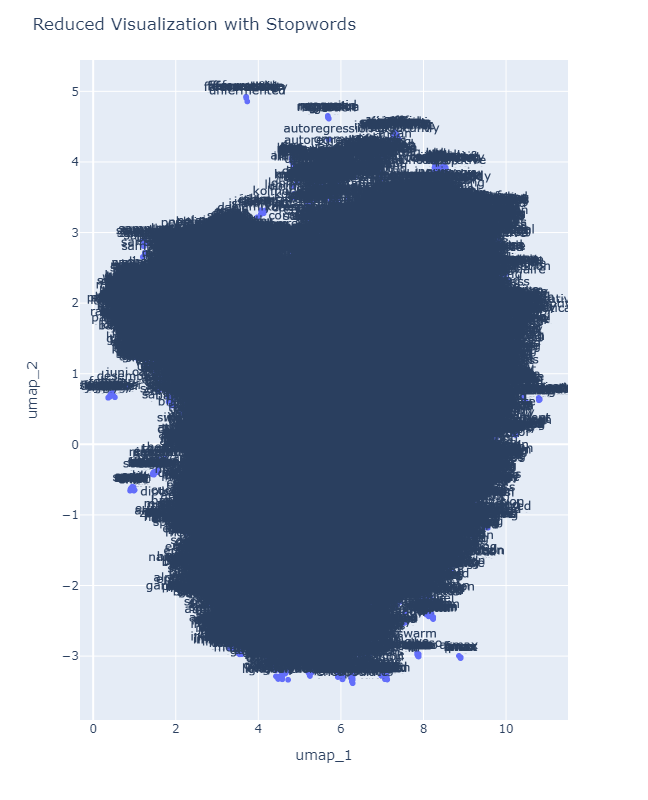

In [ ]:
fig = px.scatter(df_with_sw, text='word', x='umap_1', y='umap_2')
fig.update_traces(textposition='top center')
fig.update_layout(
    height=800,
    title_text='Reduced Visualization with Stopwords'
)
fig.show()

## Visualization Fasttext Without Stopwords

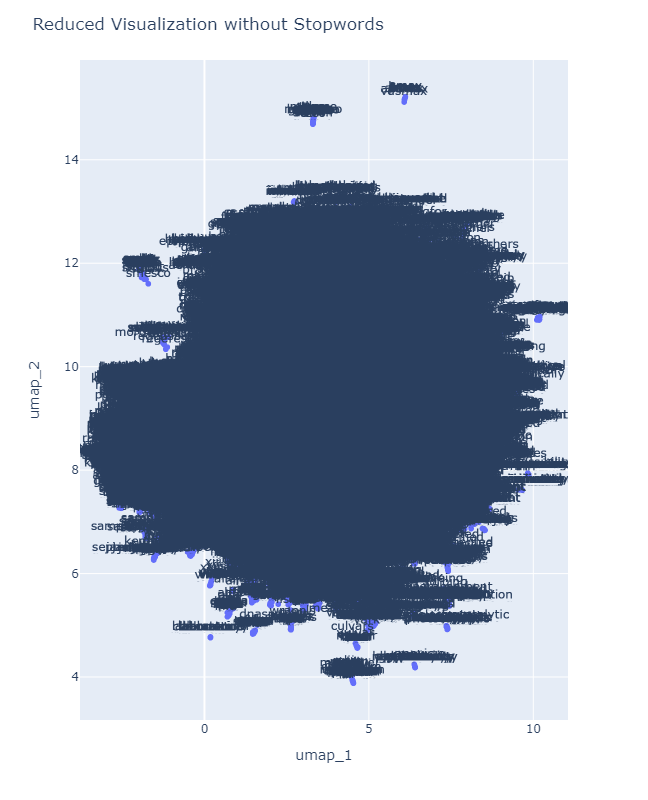

In [ ]:
fig = px.scatter(df_without_sw, text='word', x='umap_1', y='umap_2')
fig.update_traces(textposition='top center')
fig.update_layout(
    height=800,
    title_text='Reduced Visualization without Stopwords'
)
fig.show()

## Final Evaluation

### Kalimat 1
The testing mechanism is to compare the vector similarity between the human word order (label) and the embedding model (pred).

In [ ]:
from scipy import spatial

In [ ]:
# load model embedding
ft_with_sw1 = FastText.load('/content/drive/MyDrive/Upload_Github/model/fasttext/model_fasttext_abstract_with_sw_win10.ft').wv

In [ ]:
# load model embedding
ft_with_sw1 = FastText.load('model/fasttext/model_fasttext_abstract_with_sw_win10.ft').wv

In [ ]:
# transform kalimat to vektor
def norm_sent_vector(sentences, wv_model):
    vecs = [wv_model[word.lower()] for word in word_tokenize(sentences)]
    norm_vecs = [vec / np.linalg.norm(vec) for vec in vecs if np.linalg.norm(vec) > 0]
    sent_vect = np.mean(norm_vecs, axis=0)
    return sent_vect

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('student', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'teacher, learner, mathematics, achievement, participant, classroom, skill, teaching, lecturer, educator'
label = label.replace(',', '')

In [ ]:
pred

'teacher mathematics teaching classroom studepreneur learner stud teachinglearning achievement instructive'

In [ ]:
label

'teacher learner mathematics achievement participant classroom skill teaching lecturer educator'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_1 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_1

0.9688658118247986

### Kalimat 2

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('network', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'connection, system, node, server, routing, wireless, interconnection, architecture, device, networking'
label = label.replace(',', '')

In [ ]:
pred

'networked networking interconnection fanet offload manet hetnets node anet hetnet'

In [ ]:
label

'connection system node server routing wireless interconnection architecture device networking'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_2 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_2

0.8438353538513184

### Kalimat 3

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('computer', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'software, desktop, gpu, interface, plc, automation, engineering, virtualized, digital, internet'
label = label.replace(',', '')

In [ ]:
pred

'microcomputer komputer computerbased computes computerization compute computerized software automation optisystem'

In [ ]:
label

'software desktop gpu interface plc automation engineering virtualized digital internet'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_3 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_3

0.8276790380477905

### Kalimat 4

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('medical', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'healthcare, biomedical, diagnosis, doctor, nursing, specialist, surgical, cardiology, recorder, telemedicine'
label = label.replace(',', '')

In [ ]:
pred

'medically medic biomedical medication healthcare swamedication telecardiology cardiology diagnosis clinical'

In [ ]:
label

'healthcare biomedical diagnosis doctor nursing specialist surgical cardiology recorder telemedicine'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_4 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_4

0.9319828152656555

### Kalimat 5

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('school', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'teacher, junior, senior, education, academic, college, student, labschool, homeschool, smkn'
label = label.replace(',', '')

In [ ]:
pred

'labschool schoolar homeschool schoology schooling preschool scholl homeschooling teacher junior'

In [ ]:
label

'teacher junior senior education academic college student labschool homeschool smkn'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_5 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_5

0.9087552428245544

### Kalimat 6

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('architecture', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'framework, computing, system, topology, hardware, platform, computing, autoencoder, convolutional, scalable'
label = label.replace(',', '')

In [ ]:
pred

'architect microarchitecture architectural framework processor hardware multiprocessor convolution convolutional computing'

In [ ]:
label

'framework computing system topology hardware platform computing autoencoder convolutional scalable'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_6 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_6

0.9285247325897217

### Kalimat 7

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('artificial', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'intelligent, swarm, metaheuristic, evolutionary, neurofuzzy, hybridization, ffnn, optimizer, troop, machine'
label = label.replace(',', '')

In [ ]:
pred

'artificially intelligent swarm optimizes optimization intelligently intelligentsia neurofuzzy optimizer convolutional'

In [ ]:
label

'intelligent swarm metaheuristic evolutionary neurofuzzy hybridization ffnn optimizer troop machine'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_7 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_7

0.9174690842628479

### Kalimat 8

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('science', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'mathematics, biology, physic, chemistry, literacy, ethnoscience, geography, sociology, ethnoscience, inquiry'
label = label.replace(',', '')

In [ ]:
pred

'conscience ethnoscience scienticfi sciencedirect scientific neuroscience scientist scientifically biology enquiry'

In [ ]:
label

'mathematics biology physic chemistry literacy ethnoscience geography sociology ethnoscience inquiry'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_8 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_8

0.8668442368507385

### Kalimat 9

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('engineering', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'mechatronic, automotive, electronics, computer, industrial, informatics, robotics, mechanical, science, mechanic'
label = label.replace(',', '')

In [ ]:
pred

'reengineering engineer engineered veneering mechatronics pioneering electronics automotive majoring electrotechnical'

In [ ]:
label

'mechatronic automotive electronics computer industrial informatics robotics mechanical science mechanic'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_9 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_9

0.8575276732444763

### Kalimat 10

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('academic', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'lecturer, student, accordance, achievement, career, thesis, school, writing, motivation, undergraduate'
label = label.replace(',', '')

In [ ]:
pred

'nonacademic academia academician academically academy undergraduate student postgraduate lecturer akademik'

In [ ]:
label

'lecturer student accordance achievement career thesis school writing motivation undergraduate'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_10 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_10

0.8283869624137878

### Kalimat 11

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('learn', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'teaching, instructing, enquiry, writhing, teachinglearning, learningbased, learned, teach, thelearning, learnt'
label = label.replace(',', '')

In [ ]:
pred

'learnt learnig learned learner teachinglearning learningbased teach learing teaching heutagogy'

In [ ]:
label

'teaching instructing enquiry writhing teachinglearning learningbased learned teach thelearning learnt'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_11 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_11

0.960809588432312

### Kalimat 12

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('for', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'resignation, propositional, liberalization, theorist, forerunner, foreigner, forever, fort, forwarder, forth'
label = label.replace(',', '')

In [ ]:
pred

'forerunner fort fork fore forte forth forcing forefront forever forwarder'

In [ ]:
label

'resignation propositional liberalization theorist forerunner foreigner forever fort forwarder forth'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_12 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_12

0.8832621574401855

### Kalimat 13

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('research', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'literatur, esearch, thisresearch, researching, onesearch, researcher, researched, cyberliterature, search, searching'
label = label.replace(',', '')

In [ ]:
pred

'esearch thisresearch researching onesearch researcher researched search reasearch researh searching'

In [ ]:
label

'literatur esearch thisresearch researching onesearch researcher researched cyberliterature search searching'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_13 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_13

0.9697228074073792

### Kalimat 14

In [ ]:
# persiapkan label dan prediksi
pred = [i[0] for i in ft_with_sw1.similar_by_word('most', topn=10)]
pred = ' '.join(pred)

In [ ]:
label = 'since, longest, frequently, half, mount, ghost, burnt, majorly, heartwood, remarkably'
label = label.replace(',', '')

In [ ]:
pred

'almost mostly half utmost widower ost mount longest frequently ghost'

In [ ]:
label

'since longest frequently half mount ghost burnt majorly heartwood remarkably'

In [ ]:
vectors_pred = norm_sent_vector(pred, ft_with_sw1)
vectors_label = norm_sent_vector(label, ft_with_sw1)

In [ ]:
result_14 = 1 - spatial.distance.cosine(vectors_pred, vectors_label)
result_14

0.8875181078910828

### Hitung Skor Rata-Rata Pengujian

In [ ]:
final_results = np.mean([result_1, result_2, result_3, result_4, result_5, result_6, result_7, result_8, result_9, result_10, result_11, result_12, result_13, result_14])
final_results

0.8986559723104749

In [ ]:
# contoh kasus word 2 vec gagal/error dan fasttext gagal
ft_with_sw1.similar_by_word('for', topn=10)

[('forerunner', 0.6643148064613342),
 ('fort', 0.6625973582267761),
 ('fork', 0.6241984963417053),
 ('fore', 0.6239835619926453),
 ('forte', 0.6104089617729187),
 ('forth', 0.5760077834129333),
 ('forcing', 0.5552782416343689),
 ('forefront', 0.5536952018737793),
 ('forever', 0.5535434484481812),
 ('forwarder', 0.5404905676841736)]

Fasstext failed because it was only subword based. When compared with the modification results, the modification model is better able to capture semantics.